# Call statistics notebook

The goal with this notebook is to better understand the data we are working with and as a consequence obtain valuable information about the logs files we are working with.

<strong>Libraries used in the notebook</strong>

In [1]:
import pandas as pd
import numpy as np
import json
import os
import shutil
import matplotlib.pyplot as plt
from matplotlib import cm
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
import random

%matplotlib inline

<strong>Instructions to run the notebook locally</strong>

Please set the variable `path_logs` to the path where you want to access the .logs files to be converted to .json files and saved into the project `logs` directory 

In [2]:
logs_folder = '/Users/igorlimarochaazevedo/Documents/Cellcrypt/logsSeafile/'

In [3]:
logs_seafile = [dI for dI in os.listdir(logs_folder) if os.path.isdir(os.path.join(logs_folder,dI))]

The idea is to copy all the .log files from one central location to a project ./logs directory. It is important to  point out that the .log files we are working with are being obtained from Seafile everyday.

In [4]:
dst = './logs'
def copyFiles(src, dst):
    src_files = os.listdir(src)
    for file_name in src_files:
        full_file_name = os.path.join(src, file_name)
        if os.path.isfile(full_file_name):
            shutil.copy(full_file_name, dst)
            
for i in logs_seafile:
    copyFiles(logs_folder + i, dst)

In [5]:
def generateJsonFromLog(folder_path):
    ''' This method is responsible for converting .log files to .json files. Since
    python libraries work better with json files. '''
    files = []
    for r, d, f in os.walk(folder_path):
        for file in f:
            if '.log' in file:
                files.append(os.path.join(r, file))
    
    for f in files:
        pre, ext = os.path.splitext(f)
        os.rename(f, pre + '.json')
generateJsonFromLog(dst)

In [6]:
def deleteFilesEqualNames(src):
    '''This method is used to remove duplicates files in the format such as callstats_XXXX_XXXX \(1\).log
    because they are duplicates files.'''
    files = []
    file_name = ''
    for r, d, f in os.walk(src):
        for file in f:
            for k in file.split():
                if "(1).json" == k:
                    os.remove(src + '/' + file_name + ' ' + k)
                file_name = k
deleteFilesEqualNames(dst)

In [7]:
def returnListJSON(folder_path):
    '''This method returns an array of all .json files inside of the logs folder.'''
    files = []
    for r, d, f in os.walk(folder_path):
        for file in f:
            if '.json' in file:
                files.append(os.path.join(r, file))
    return files
list_logs = returnListJSON("./logs")

In [8]:
def getLogDF(list_logs):
    '''Returns a dataframe containing all the informations except from call's parameters.
    Informations such as alias, IP, status, rating, etc. Except for the data parameter, since
    it needs to be separated into a new dataframe in order to obtain a more organized and easier 
    to work structure'''
    df = pd.DataFrame()
    frames = []
    
    for i in range(len(list_logs)):
        with open(list_logs[i]) as f:
            file_json = json.load(f)
            df = pd.json_normalize(file_json)
            df = df.drop(['data'], axis=1)
            df = df.drop_duplicates()
            frames.append(df)

    df = pd.concat(frames)
    df = df.reset_index()
    
    return df
df_log = getLogDF(list_logs)
print(df_log.shape)
df_log.head()

(239, 15)


,index,alias,peer,type,version,call_id,client,address,timestamp,duration,status,media_relay,rating,issue,comment
0,0,adam.such+andrfed@csghq.com,bobbi.such+andfed@csghq.com,1,101-3.131.0.3131000-FED,bobbi.such+andfed@csghq.com,0,174.248.27.4,1599759351,1784,7,NaN,NaN,NaN,NaN
1,0,harvey+andfed@csghq.com,rogerio.richa@cellcrypt.com,1,101-3.131.0.3131000-FED,rogerio.richa@cellcrypt.com,0,197.188.173.89,0,0,11,NaN,NaN,NaN,NaN
2,0,bobbi.such+andfed@csghq.com,adam.such+andrfed@csghq.com,1,3.132.0,adam.such+andrfed@csghq.com,0,174.240.133.122,1600209395,456,7,NaN,NaN,NaN,NaN
3,0,adam.such+andrfed@csghq.com,bobbi.such+andfed@csghq.com,1,101-3.131.0.3131000-FED,bobbi.such+andfed@csghq.com,0,73.39.154.180,1599839852,1121,7,NaN,NaN,NaN,NaN
4,0,vitor.monticelli@csghq.com,ricardo.heffel+win@csghq.com,1,101-3.131.0.3131000-FED,ricardo.heffel+win@csghq.com,0,191.191.46.59,1599680922,189,7,NaN,NaN,NaN,NaN


In [9]:
def genCallParametersDF(list_logs):
    '''This method generates a single dataframe with all the call's informations
    obtained from every .json file. The general idea here was to unify all variables 
    in a single dataframe and appeding to it an alias and a timestamp. This way, 
    it is possible to unique identify every column in the dataframe.'''
    data = {'time': [], 
            'latency': [], 
            'jitter_rx': [],
            'jitter_tx': [],
            'packet_loss_rx': [],
            'packet_loss_tx': [],
            'alias': [],
            'call_id':[],} 
    df = pd.DataFrame(data)
    frames = []
    for i in range(len(list_logs)):
        with open(list_logs[i]) as f:
            file_json = json.load(f)
            df_json = pd.json_normalize(file_json['data'])
            df_json['alias'] = file_json['alias']
            df_json['timestamp'] = file_json['timestamp']
            df_json['status'] = file_json['status']
            if 'call_id' in file_json:
                df_json['call_id'] = file_json['call_id']
            else:
                df_json['call_id'] = np.nan
            frames.append(df_json)

    df = pd.concat(frames)
    df = df.reset_index()
    
    return df

df_call_parameters = genCallParametersDF(list_logs)
print(df_call_parameters.shape)
df_call_parameters.head()

(72347, 11)


,index,time,latency,jitter_rx,jitter_tx,packet_loss_rx,packet_loss_tx,alias,timestamp,status,call_id
0,0,0.0,0.0,0.0,0.0,100.0,0.0,adam.such+andrfed@csghq.com,1599759351,7,bobbi.such+andfed@csghq.com
1,1,1.0,0.0,0.0,0.0,100.0,0.0,adam.such+andrfed@csghq.com,1599759351,7,bobbi.such+andfed@csghq.com
2,2,2.0,50.0,4.0,0.0,0.0,0.0,adam.such+andrfed@csghq.com,1599759351,7,bobbi.such+andfed@csghq.com
3,3,3.0,50.0,11.0,0.0,0.0,0.0,adam.such+andrfed@csghq.com,1599759351,7,bobbi.such+andfed@csghq.com
4,4,4.0,50.0,12.0,0.0,0.0,0.0,adam.such+andrfed@csghq.com,1599759351,7,bobbi.such+andfed@csghq.com


In [10]:
def getOneFile(alias, timestamp):
    '''Function to ge one occurence in the dataframe based on the two paramaters that unique
    identify a call. In other words, by filtering the call based on alias and timestamp we can 
    get a unique call'''
    df_ = df_call_parameters[df_call_parameters['alias'] == alias]
    df_ = df_[df_['timestamp'] == timestamp]
    
    return df_

def getRating(alias, timestamp):
    '''Method to get the rating of a specific call based on the two parameters that unique 
    identify a call.'''
    df_ = df_log[df_log['alias'] == alias]
    df_ = df_[df_['timestamp'] == timestamp]
    
    return df_['rating'].iloc[0]

### Descriptive statistics about our call measurements 

In [11]:
df_call_parameters.describe()

,index,time,latency,jitter_rx,jitter_tx,packet_loss_rx,packet_loss_tx,timestamp,status
count,72347.000000,72347.000000,72347.000000,72347.000000,72347.000000,72347.000000,72347.000000,7.234700e+04,72347.000000
mean,682.060583,682.248718,123.221143,12.342668,14.193332,0.861805,1.068614,1.599792e+09,6.991195
std,662.832818,662.846506,105.174625,7.082480,4.009528,5.852109,2.640965,2.142282e+05,0.248107
min,0.000000,0.000000,0.000000,-1.000000,0.000000,-1.000000,0.000000,1.599247e+09,0.000000
25%,168.000000,168.000000,36.000000,11.000000,13.000000,0.000000,0.000000,1.599680e+09,7.000000
50%,452.000000,452.000000,80.000000,15.000000,15.000000,0.000000,0.000000,1.599772e+09,7.000000
75%,1029.000000,1029.000000,210.000000,16.000000,16.000000,0.000000,1.000000,1.599860e+09,7.000000
max,3413.000000,3413.000000,432.000000,34.000000,38.000000,100.000000,50.000000,1.600252e+09,7.000000


### Table grouped by status to obtain an insight about how many different status number we have in our data

In [12]:
df_call_status = df_call_parameters.groupby('status').count()
df_call_status.head()

,index,time,latency,jitter_rx,jitter_tx,packet_loss_rx,packet_loss_tx,alias,timestamp,call_id
status,,,,,,,,,,
0,91,91,91,91,91,91,91,91,91,91
7,72256,72256,72256,72256,72256,72256,72256,72256,72256,72256


### Table grouped by rating to obtain an insight about how many different ratings we have in our data

In [13]:
df_call_rating = df_log.groupby('rating').count()
df_call_rating.head()

,index,alias,peer,type,version,call_id,client,address,timestamp,duration,status,media_relay,issue,comment
rating,,,,,,,,,,,,,,
0.0,47,47,47,47,47,47,47,47,47,47,47,4,47,40


## Boxplot for that descriptive statistics dataframe obtained above 

In [14]:
def autolabel(rects, ax):
    """Attach a text label above each bar in *rects*, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

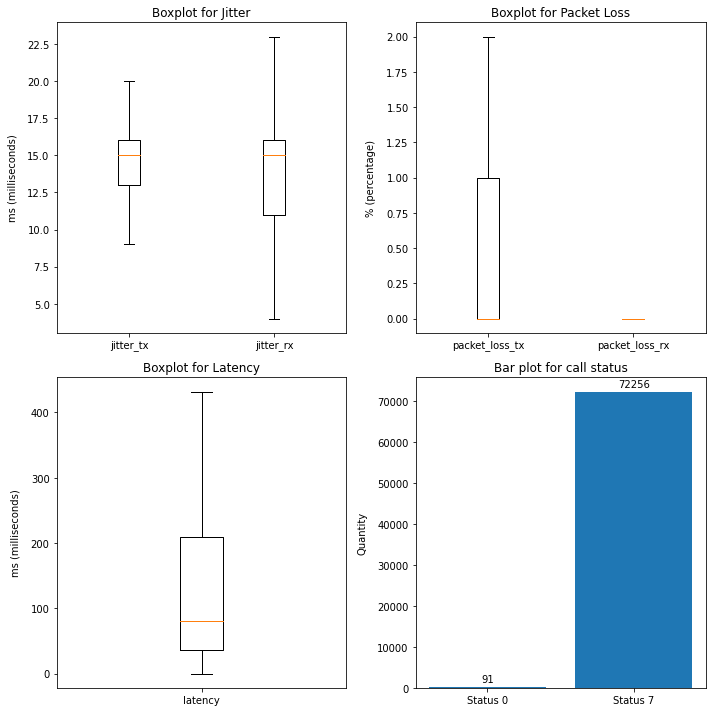

In [15]:
fig, axs = plt.subplots(2, 2, figsize=(10, 10))

### Jitter
labels_jitter = ['jitter_tx', 'jitter_rx']
axs[0, 0].boxplot([df_call_parameters['jitter_tx'], df_call_parameters['jitter_rx']], 
                             labels=labels_jitter, showfliers=False)
axs[0, 0].set_ylabel('ms (milliseconds)', labelpad=10, fontsize=10)
axs[0, 0].set_title('Boxplot for Jitter', fontsize=12, ha='center')

### Packet Loss
labels_packet_loss = ['packet_loss_tx', 'packet_loss_rx']
axs[0, 1].boxplot([df_call_parameters['packet_loss_tx'], df_call_parameters['packet_loss_rx']], 
                             labels=labels_packet_loss, showfliers=False)
axs[0, 1].set_ylabel('% (percentage)', labelpad=10, fontsize=10)
axs[0, 1].set_title('Boxplot for Packet Loss', fontsize=12, ha='center')

### Latency
label_latency = ['latency']
axs[1, 0].boxplot([df_call_parameters['latency']], 
                             labels=label_latency, showfliers=False)
axs[1, 0].set_ylabel('ms (milliseconds)', labelpad=10, fontsize=10)
axs[1, 0].set_title('Boxplot for Latency', fontsize=12, ha='center')

### Status
labels_status = ['Status 0', 'Status 7']
rects1 = axs[1, 1].bar(labels_status, df_call_status['index'].values)
autolabel(rects1, axs[1, 1])

axs[1, 1].set_ylabel('Quantity', labelpad=10, fontsize=10)
axs[1, 1].set_title('Bar plot for call status', fontsize=12, ha='center')

# plt.legend()
plt.tight_layout()
plt.show()

<strong>Same boxplot but using a more interactive library</strong>

In [16]:
fig = make_subplots(rows=2, cols=2, subplot_titles=("Jitter", "Packet Loss", 
                                                    "Latency", "Status"))


### Jitter
fig.add_trace(go.Box(y=df_call_parameters['jitter_rx'], name="jitter_rx",
                      boxpoints=False, marker_color='rgb(7,40,89)'),
                      row=1, col=1)

fig.add_trace(go.Box(y=df_call_parameters['jitter_tx'], name="jitter_tx",
                     boxpoints=False, marker_color='rgb(107,174,214)'),
                     row=1, col=1)

### Packet Loss
fig.add_trace(go.Box(y=df_call_parameters['packet_loss_rx'], name="packet_loss_rx", 
                     boxpoints=False, marker_color='rgb(7,40,89)'),
                     row=1, col=2)

fig.add_trace(go.Box(y=df_call_parameters['packet_loss_tx'], name="packet_loss_tx", 
                     boxpoints=False, marker_color='rgb(107,174,214)'),
                     row=1, col=2)

### Latency
fig.add_trace(go.Box(y=df_call_parameters['latency'], name="latency", marker_color='rgb(107,174,214)'),
              row=2, col=1)


### Call Status
labels_status = []
for i in df_call_status.index.values:
    labels_status.append('Status ' + str(i))
    
fig.add_trace(go.Bar(y=df_call_status['index'], 
                     x=labels_status,
                     text=df_call_status['index'], 
                     textposition='auto',
                     marker_color='rgb(7,40,89)'),
                     row=2, col=2)

# Update xaxis properties
fig.update_xaxes(title_text="Status code", row=2, col=2)

# Update yaxis properties
fig.update_yaxes(title_text="ms (milliseconds)", row=1, col=1)
fig.update_yaxes(title_text="% (percentage)", row=1, col=2)
fig.update_yaxes(title_text="ms (milliseconds)", showgrid=False, row=2, col=1)
fig.update_yaxes(title_text="Quantity", row=2, col=2)

fig.update_yaxes(automargin=True)
fig.update_layout(height=800, width=1000, title_text="General Info about the logs")
fig.show()


### Scatter matrix for the 5 main variables from our dataframe

The goal of a scatter matrix is to see the relationship between variables. Therefore, our goal with this chart was to obtain a better visualization about the relationship between jitter_tx, jitter_rx, packet_loss_tx, packet_loss_rx and latency

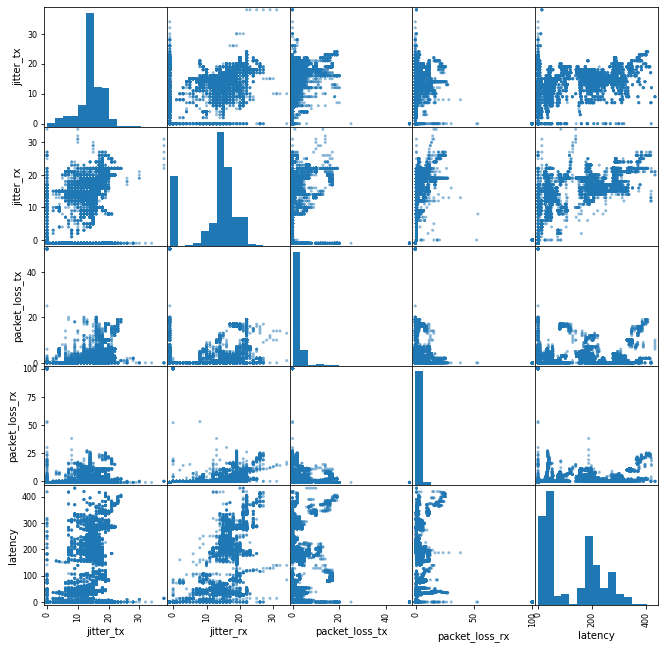

In [17]:
df_ = df_call_parameters[['jitter_tx', 'jitter_rx', 'packet_loss_tx', 'packet_loss_rx', 'latency']]
cmap = cm.get_cmap('gnuplot')

scatter = pd.plotting.scatter_matrix(df_, marker = '.',
                                     hist_kwds={'bins':15}, figsize=(11,11), cmap=cmap)

In [18]:
def time_Mean_latency(df_call_parameters):
    '''Return a dataframe with the average latency by second in the entire dataframe'''
    df_ = df_call_parameters.groupby('time').mean()
    return df_['latency']
time_Mean_latency(df_call_parameters).head()

time
0.0     0.446970
1.0     4.420455
2.0     9.804598
3.0    26.790419
4.0    44.006329
Name: latency, dtype: float64

In [19]:
def returnRandomLogs(df_call_parameters):
    '''Method used to obtain random calls from our .log folder in order to make a less biased first step
    approach. This function should be used for a precision unbiased approach, but to get a general visualization
    of what is happening in different files in our folder'''
    arr_df = []
    for i in range(5):
        df_ = pd.DataFrame()
        rows_size = df_call_parameters.shape[0]
        rand_int = random.randint(0, rows_size)

        alias = df_call_parameters['alias'][rand_int]

        df_ = df_call_parameters[df_call_parameters['alias'] == alias]

        timestamp = df_['timestamp'].iloc[0]

        df_ = df_[df_['timestamp'] == timestamp]

        arr_df.append(df_)
    return arr_df
arr_df = returnRandomLogs(df_call_parameters)

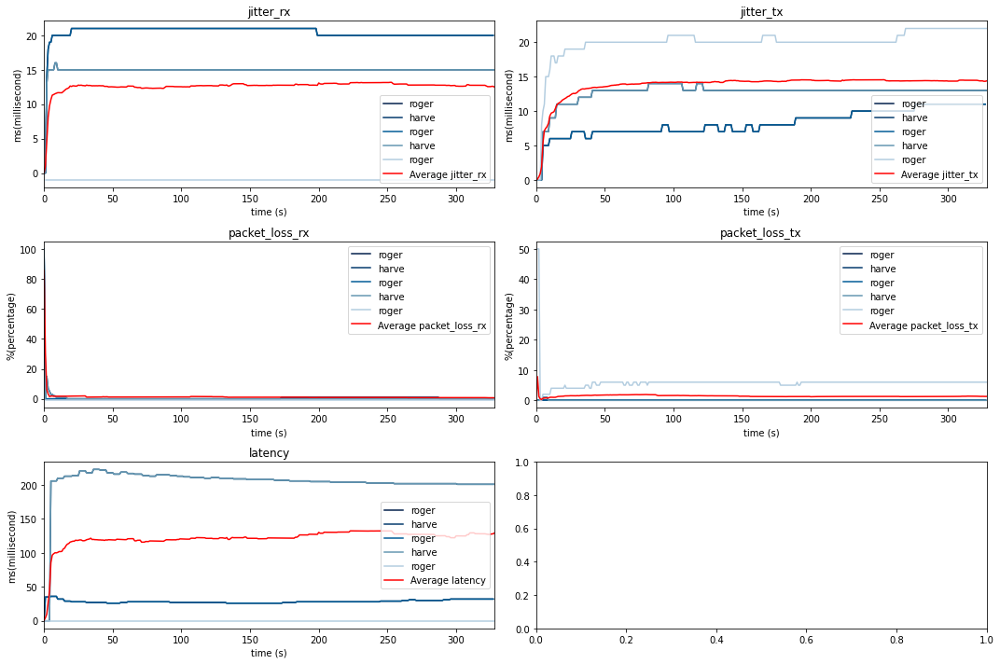

In [20]:
def plotVariable(arr_df, df_call_parameters):
    
    '''This method receives an array of dataframes - arr_df, a dataframe - df_call_parameters
    and then it plots all the the dataframes provided in the arr_df for our main 5 parameters.
    Jitter_tx, jitter_rx, packet_loss_tx, packet_loss_rx and latency.'''
    
    fig, axs = plt.subplots(3, 2, figsize=(15, 10))
    arr_df = returnRandomLogs(df_call_parameters)
    
    colors = ['#011f4b', '#03396c', '#005b96', '#6497b1', '#b3cde0']
    k = 0
    x_lim = 10000
    
    for i in range(3):
        for j in range(2):
            if i == 0 and j == 0:
                variable_to_plot = 'jitter_rx'
                ylabel = 'ms(millisecond)'
            elif i == 0 and j == 1:
                variable_to_plot = 'jitter_tx'
                ylabel = 'ms(millisecond)'
            elif i == 1 and j == 0:
                variable_to_plot = 'packet_loss_rx'
                ylabel = '%(percentage)'
            elif i == 1 and j == 1:
                variable_to_plot = 'packet_loss_tx'
                ylabel = '%(percentage)'
            elif i == 2 and j == 0:
                variable_to_plot = 'latency'
                ylabel = 'ms(millisecond)'
            else:
                continue
                
            k=0
            for df_ in arr_df:
                max_var = df_.shape[0]
                if max_var < x_lim:
                    x_lim = max_var

                axs[i, j].plot(df_['time'], 
                               df_[variable_to_plot], 
                               label=df_['alias'].iloc[0][0:5],
                               color=colors[k])

                axs[i, j].set(xlabel='time (s)', ylabel=ylabel)
                axs[i, j].set_title(variable_to_plot)
                k+=1
                
            df_ = df_call_parameters.groupby('time').mean()
            axs[i, j].plot(df_.index, df_[variable_to_plot], 
                           label='Average ' + variable_to_plot, color='red')
            axs[i, j].set_xlim(0, x_lim)
            axs[i, j].legend()
        
    plt.tight_layout()
    plt.show()
    
plotVariable(arr_df, df_call_parameters)


In [21]:
def getUniqueAlias(df_log):
    '''This method is being used to get a dataframe which contains the unique values of alias 
    in our .log folder'''
    alias_arr = []
    rows_size = df_log.shape[0]
    for i in range(rows_size):
        alias = df_log['alias'].iloc[i]
        if alias not in alias_arr:
            alias_arr.append(alias)
            
    return alias_arr
# getUniqueAlias(df_log)

## Splitting up the csv based on jitter, packet loss and latency values

Based on the literature we know the minimum required values for a Excellent-to-Good call threshold and Good-to-Fair call threshold. More specifically when can show a table from the reference [1] that show the quality thresholds for some codecs and buffers

<img src="./images/table_quality_thresholds.PNG"
     alt="Markdown Monster icon"
     style="float: left; margin-right: 10px;" />


##### Split Log files into three categories

1. Alias with the 4 best latency, jitter and packet loss values
2. Alias with the 4 worst latency, jitter and packet loss values
3. Alias at the first quartile of a dataframe ordered by latency, jitter and packet loss values depending o the chart being ploted
4. Alias at the in the middle of a dataframe ordered by latency, jitter and packet loss values depending o the chart being ploted
5. Alias at the third quartile of a dataframe ordered by latency, jitter and packet loss values depending o the chart being ploted

In [22]:
def select4CallOccurences(df_call_parameters, parameter, type_position, minimun_time_minutes):
    df_ = df_call_parameters.groupby(by=['alias', 'timestamp'])\
            .max().sort_values(by=['time'])
    
    if type_position == 'best':
        df = df_call_parameters.groupby(by=['alias', 'timestamp'])\
                .mean().sort_values(by=[parameter])
        df['max_time'] = df_['time']
        df = df[df['max_time'] > minimun_time_minutes*60][parameter]
        df = df[df.iloc[:] > 0.0].iloc[0:4]
        
    elif type_position == 'worst':
        df = df_call_parameters.groupby(by=['alias', 'timestamp'])\
                .mean().sort_values(by=[parameter], ascending=False)
        df['max_time'] = df_['time']
        df = df[df['max_time'] > minimun_time_minutes*60][parameter]
        df = df[df.iloc[:] > 0.0].iloc[0:4]
        
    elif type_position == 'middle':
        df = df_call_parameters.groupby(by=['alias', 'timestamp'])\
                .mean().sort_values(by=[parameter])
        df['max_time'] = df_['time']
        df = df[df['max_time'] > minimun_time_minutes*60][parameter]
        middle_pos = int(df.shape[0]/2)
        df = df.iloc[middle_pos:middle_pos+4]
        
    elif type_position == 'first_quartile':
        df = df_call_parameters.groupby(by=['alias', 'timestamp'])\
                .mean().sort_values(by=[parameter])
        df['max_time'] = df_['time']
        df = df[df['max_time'] > minimun_time_minutes*60][parameter]
        first_quartile = int(df.shape[0]/4)
        df = df.iloc[first_quartile:first_quartile+4]
    
    elif type_position == 'third_quartile':
        df = df_call_parameters.groupby(by=['alias', 'timestamp'])\
                .mean().sort_values(by=[parameter])
        df['max_time'] = df_['time']
        df = df[df['max_time'] > minimun_time_minutes*60][parameter]
        third_quartile = int(df.shape[0]/2 + df.shape[0]/4)
        df = df.iloc[third_quartile:third_quartile+4]
    
    return df

In [23]:
### We are selecting calls with minimun one minute length
arr_options = ['first_quartile', 'middle', 'third_quartile', 'worst', 'best']
arr_parameter = ['latency', 'jitter_tx', 'jitter_rx', 'packet_loss_tx', 'packet_loss_rx']

arr_df_latency = []
arr_df_jitter_tx = []
arr_df_jitter_rx = []
arr_df_packet_loss_tx = []
arr_df_packet_loss_rx = []
arr_arr = [arr_df_latency, arr_df_jitter_tx, arr_df_jitter_rx, 
              arr_df_packet_loss_tx, arr_df_packet_loss_rx]

for i, parameter in enumerate(arr_parameter):
    for opt in arr_options:
        arr_arr[i].append(select4CallOccurences(df_call_parameters, parameter, opt, 1))

#### Goal with the charts below
The idea is to plot the dataframes obtained above (GREAT, BAD, MEDIAN, FIRST AND THIRD QUARTILE) values of our parameters in order to compare those with the average of the same parameter. In this section we are dealing with latency.

In [24]:
def plotParameter(df_, df_call_parameters, title, parameter_to_plot, figsize):
    
    '''This function will receive the df_ filtered with tha data you want to plot. The format
    of such parameter should be shape[0] == 4, since we are creating a figure with 4 charts'''
    
    ylabel=''
    if parameter_to_plot == 'packet_loss_rx' or parameter_to_plot == 'packet_loss_tx':
        ylabel = '%(percentage)'
    else:
        ylabel = 'milliseconds'
    
    x_lim = 1000000
    mili = 1000
    
    alias_timestamp = []
    for i in range(df_.shape[0]):
        alias_timestamp.append((df_.index[i][0], df_.index[i][1]))
    
    fig, axs = plt.subplots(int(df_.shape[0]/2), 2, figsize=figsize)
    
    k=0
    for i in range(2):
        for j in range(2):
            df = getOneFile(alias_timestamp[k][0], alias_timestamp[k][1])
            df[parameter_to_plot] = df[parameter_to_plot].div(mili)
            
            axs[i, j].plot(df['time'], 
                           df[parameter_to_plot], 
                           label=df['alias'].iloc[0][0:5])

            axs[i, j].set(xlabel='time (s)', ylabel=ylabel)
            axs[i, j].set_title(parameter_to_plot)

            df_ = df_call_parameters.groupby('time').mean()
            df_[parameter_to_plot] = df_[parameter_to_plot].div(mili)
            axs[i, j].plot(df_.index, df_[parameter_to_plot], 
                           label='Average ' + parameter_to_plot, color='red')
            axs[i, j].set_xlim(0, df.shape[0])
            axs[i, j].legend()
            k+=1
    
    fig.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

In [25]:
def getLabels(parameter):
    labels = []
    labels.append('Alias in the FIRST quartile of our ordered {} table'.format(parameter))
    labels.append('Alias in the MIDDLE of our ordered {} table'.format(parameter))
    labels.append('Alias in the THIRD quartile of our ordered {} table'.format(parameter))
    labels.append('Alias with BAD {}'.format(parameter))
    labels.append('Alias with GREAT {}'.format(parameter))
    return labels

#### Latency Charts

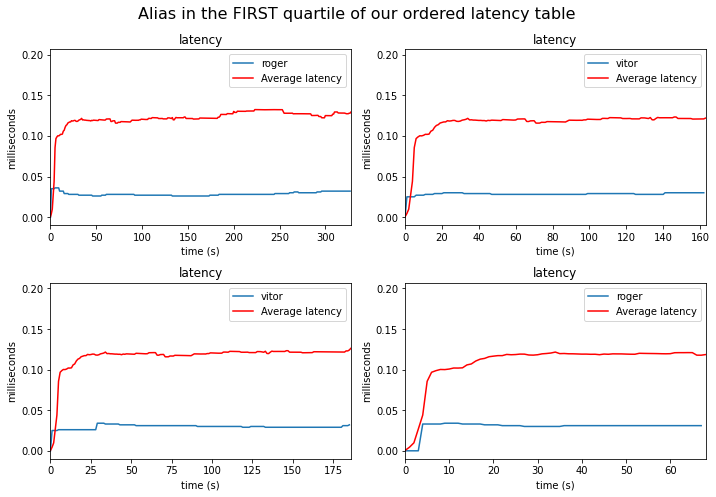

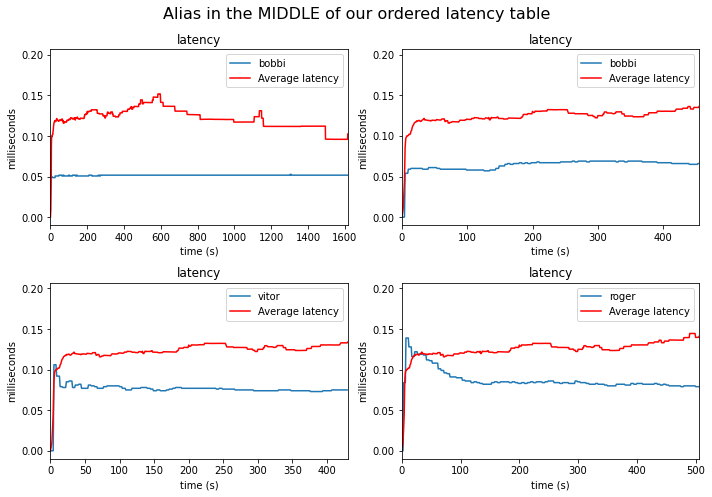

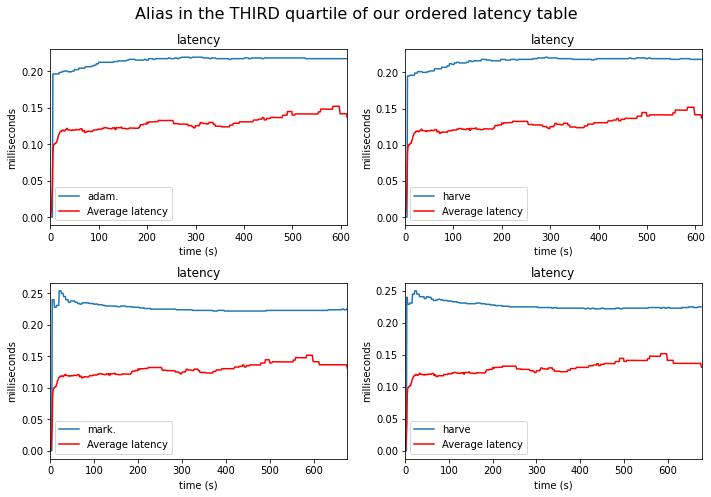

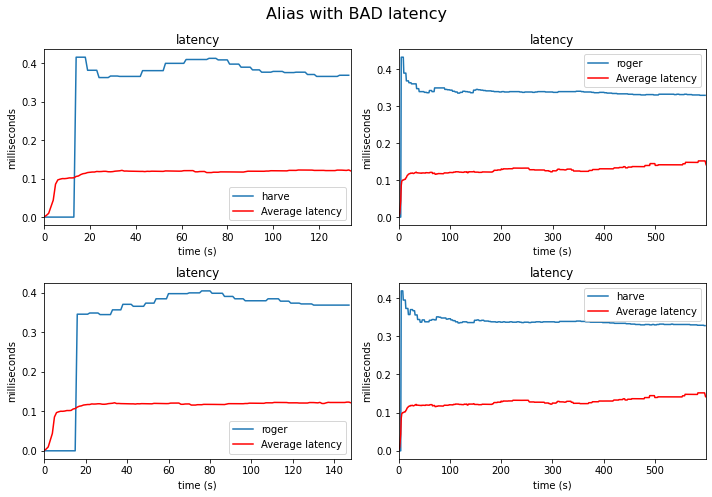

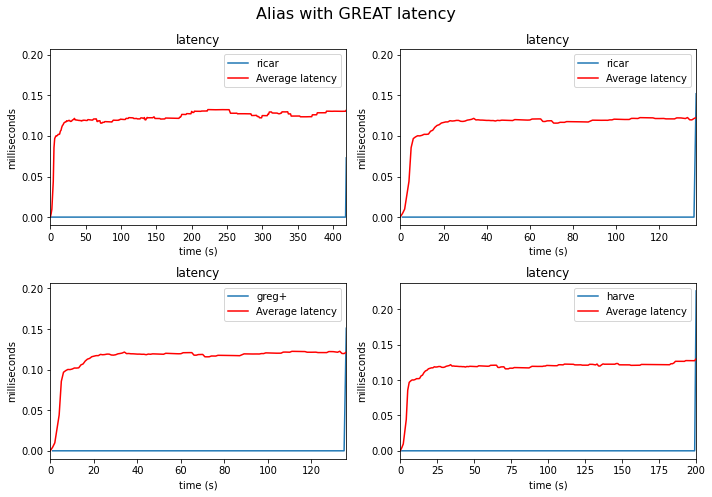

In [26]:
figszize = (10, 7)
parameter = 'latency'
arr_plot = arr_df_latency
labels = getLabels(parameter);
for i, label in enumerate(labels):
    plotParameter(arr_plot[i], df_call_parameters, label, parameter, figszize)


#### Jitter Tx Charts

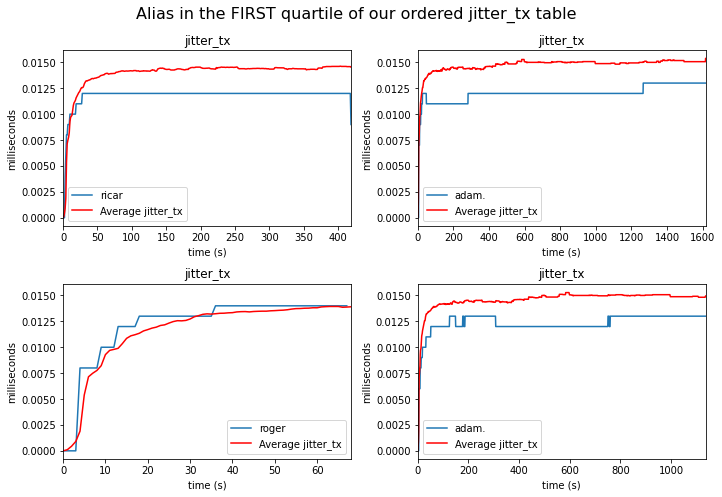

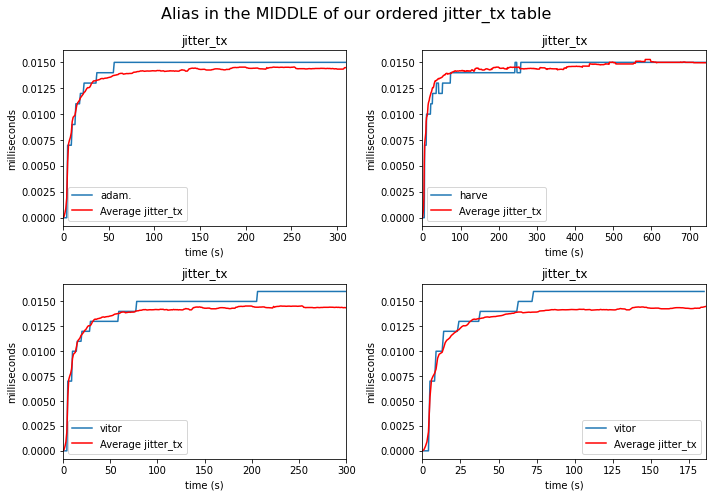

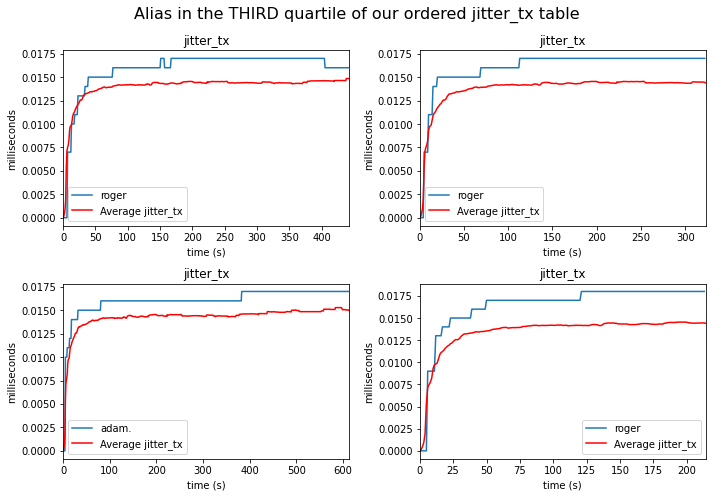

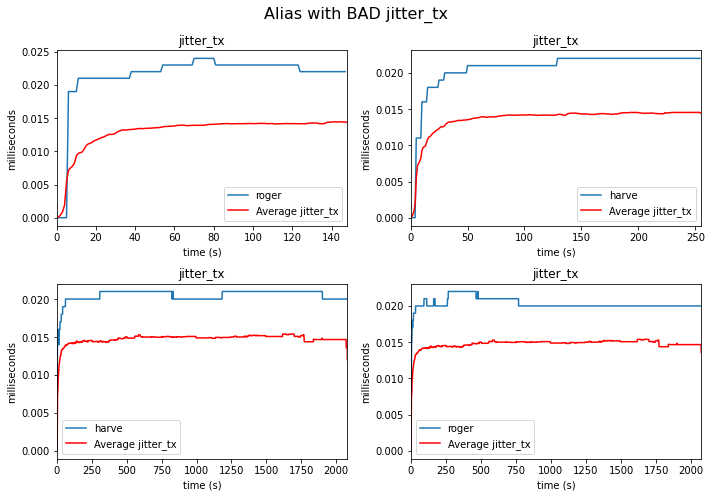

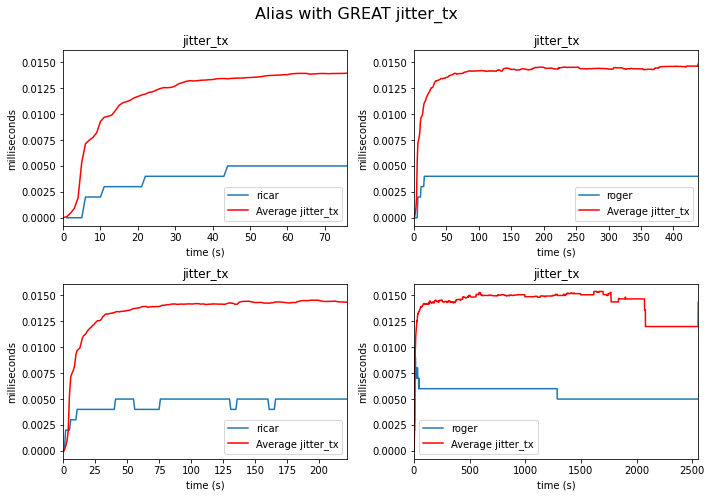

In [27]:
figszize = (10, 7)
parameter = 'jitter_tx'
arr_plot = arr_df_jitter_tx
labels = getLabels(parameter);
for i, label in enumerate(labels):
    plotParameter(arr_plot[i], df_call_parameters, label, parameter, figszize)


#### Jitter Rx Charts

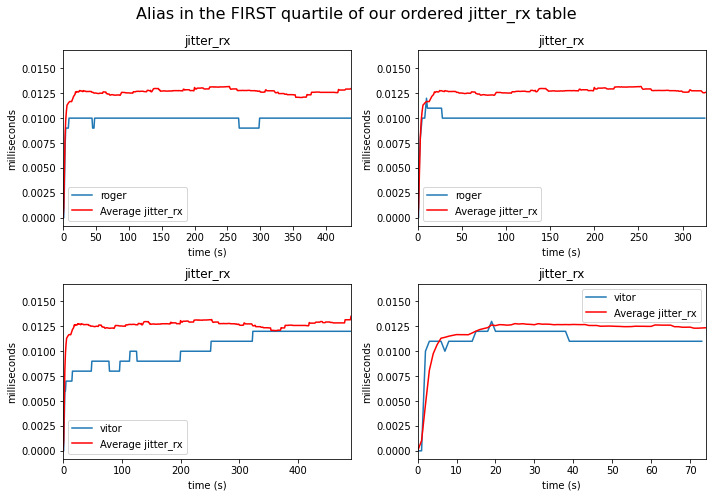

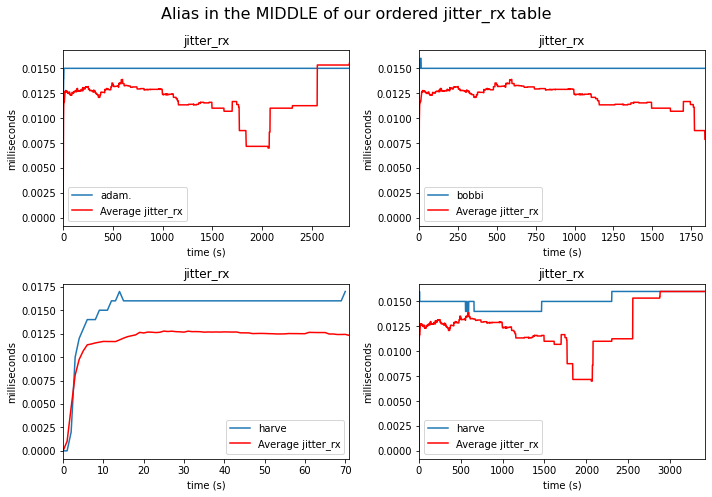

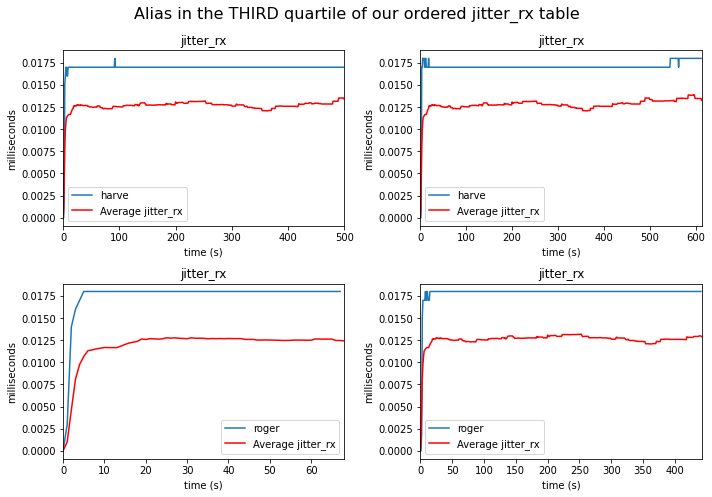

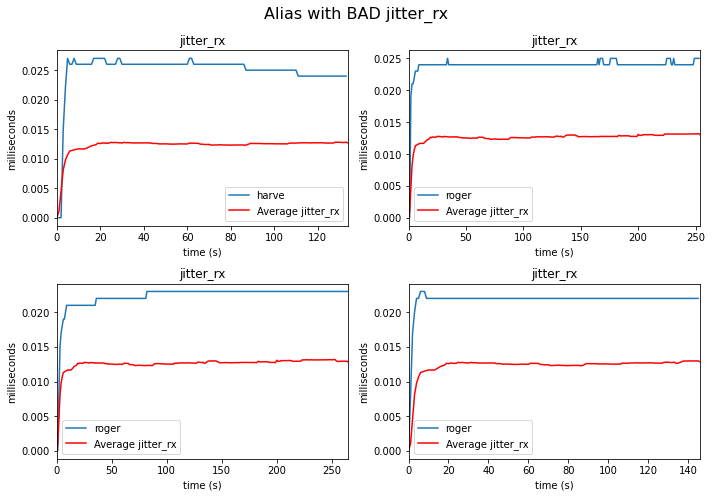

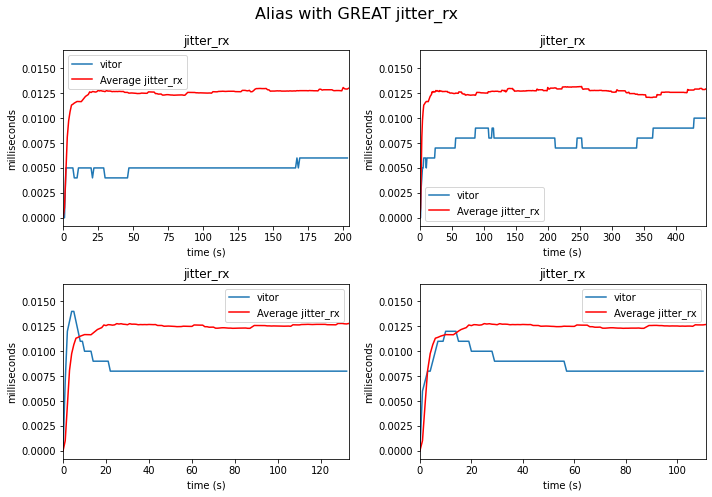

In [28]:
figszize = (10, 7)
parameter = 'jitter_rx'
arr_plot = arr_df_jitter_rx
labels = getLabels(parameter);
for i, label in enumerate(labels):
    plotParameter(arr_plot[i], df_call_parameters, label, parameter, figszize)


#### Packet Loss Tx Charts

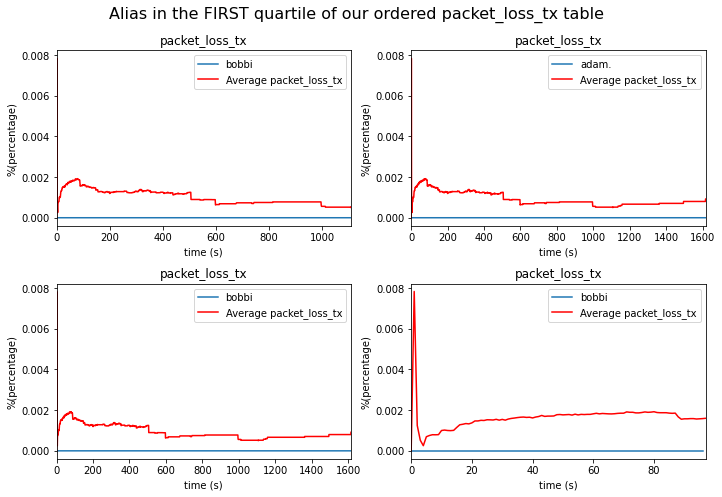

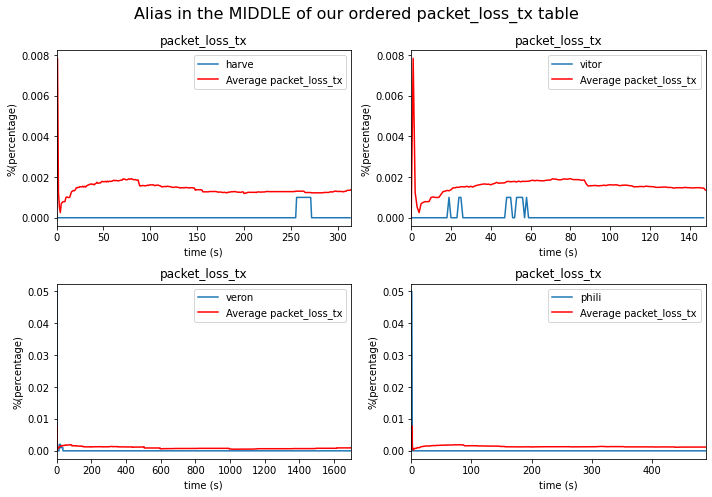

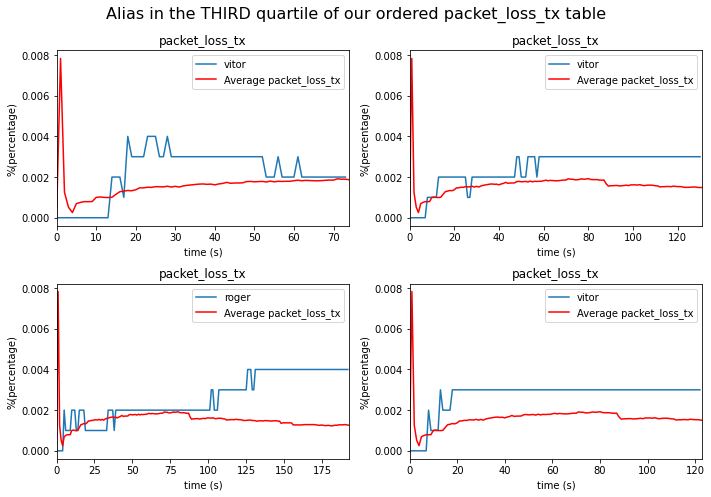

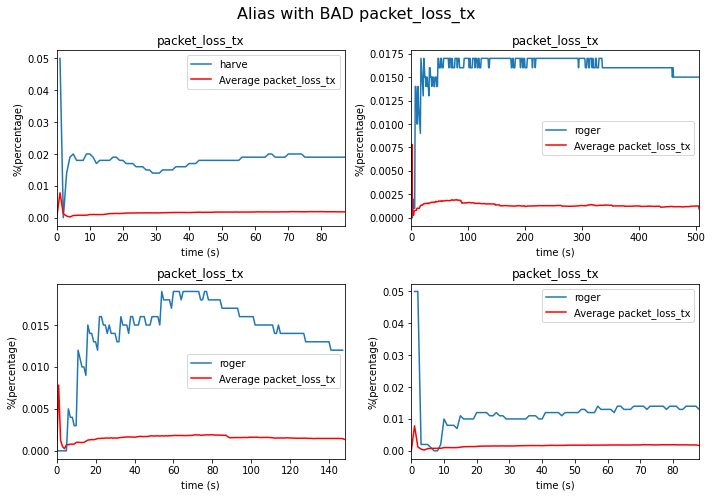

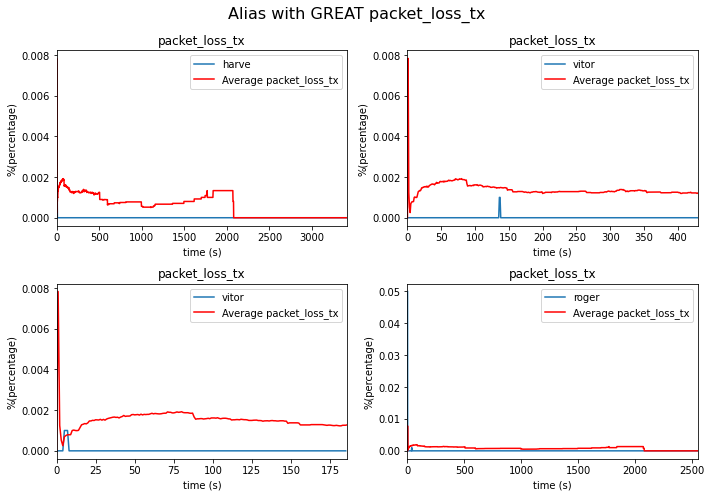

In [29]:
figszize = (10, 7)
parameter = 'packet_loss_tx'
arr_plot = arr_df_packet_loss_tx
labels = getLabels(parameter);
for i, label in enumerate(labels):
    plotParameter(arr_plot[i], df_call_parameters, label, parameter, figszize)


#### Packet Loss Rx Charts

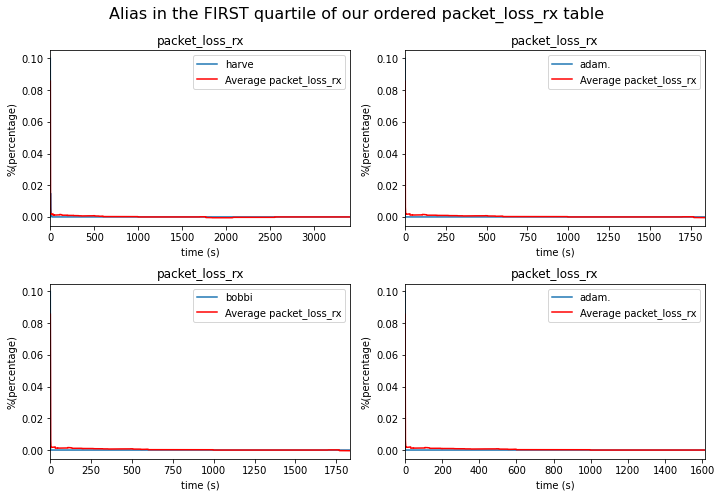

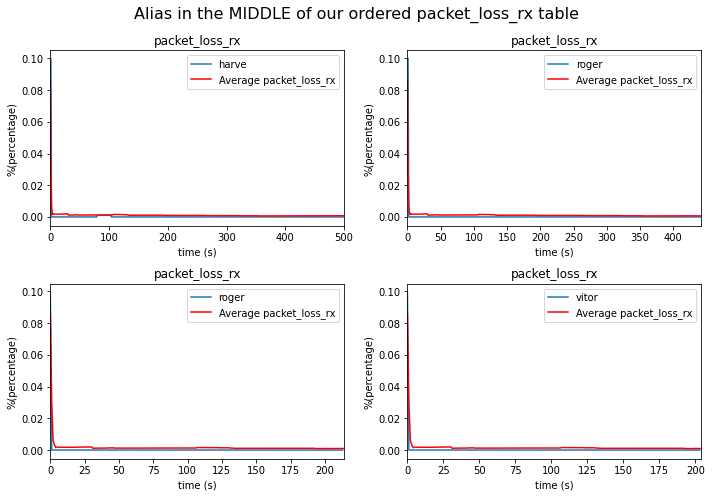

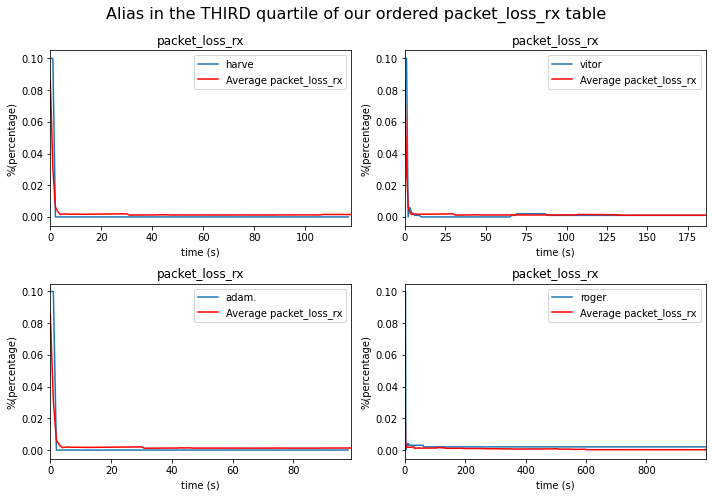

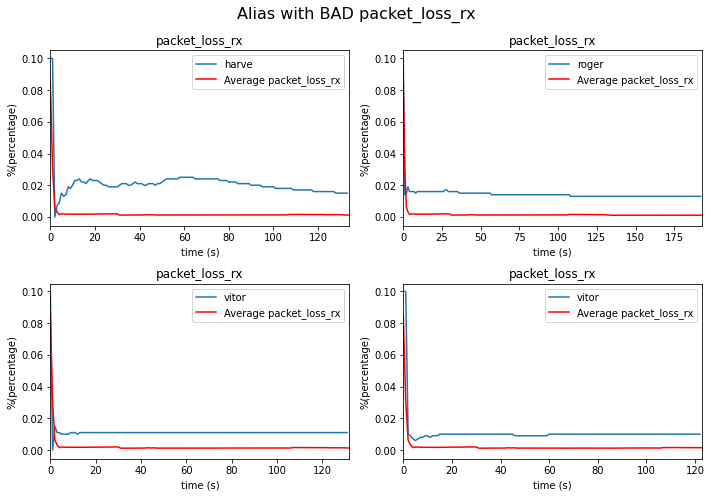

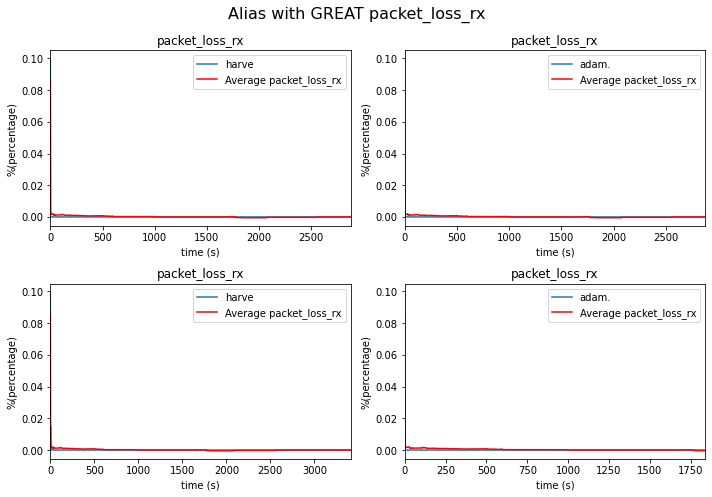

In [30]:
figszize = (10, 7)
parameter = 'packet_loss_rx'
arr_plot = arr_df_packet_loss_rx
labels = getLabels(parameter);
for i, label in enumerate(labels):
    plotParameter(arr_plot[i], df_call_parameters, label, parameter, figszize)


## References
[1] Hu, Z., Yan, H., Yan, T., Geng, H. and Liu, G.
Evaluating QoE in VoIP networks with QoS mapping and machine learning algorithms

In-text: (Hu et al., 2020)

Your Bibliography: Hu, Z., Yan, H., Yan, T., Geng, H. and Liu, G., 2020. Evaluating Qoe In Voip Networks With Qos Mapping And Machine Learning Algorithms.
